## This data science project aims to predict possibility of road accident and its severity. This will help road users to decide on a journey and driving habit.  The dataset contains various details like severity, collision type, injuries, fatality, location, etc. 

In [92]:
import pandas as pd
import numpy as np

### About dataset

This dataset is about past road accident and severity. The __data_collisions.csv__ data set includes details of 194672 accident records, location of accident and severity. It includes some of the following fields:

| Field          | Description                                                                           |
|----------------|---------------------------------------------------------------------------------------|
| Location       | location of collision                                                                 |
| Severity       | Code the correspond to the severity of the collision                                  |
| severity Desc  | A detailed description of the severity of the collision                               | 
| Ped count      | The number of pedestrians                                                             |
| SeriousInjuries| The number of serious injuries in the collision                                       |
| Injuries       | The number of total injuries in the collision                                         |
| Fatalities     | The number of fatalities in the collision                                             |
| Weather        | Wseather condition during the time of the collision                                   |
| COLLISIONTYPE  | collision type                                                                        |
| PERSONCOUNT    |The total number of people involved in the collision                                   |
| PEDCYLCOUNT    | The number of bicycles involved in the collision. This is entered by the state.       | 
| VEHCOUNT       | The number of vehicles involved in the collision.This is entered by the state.        |
| INCDATE        | The date of the incident                                                              |
| INCDTTM        | The date and time of the incident.                                                    |
| JUNCTIONTYPE   | Category of junction at which collision took place                                    |
| SDOT_COLCODE   | A code given to the collision by SDOT.                                                |
| SDOT_COLDESC   | A description of the collision corresponding to the collision code.                   |
| INATTENTIONIND | Whether or not collision was due to inattention. (Y/N                                 |
| UNDERINFL      | Whether or not a driver involved was under the influence of drugs or alcohol.         | 
| ROADCOND       | The condition of the road during the collision.                                       |
| LIGHTCOND      | The light conditions during the collision.                                            |
| PEDROWNOTGRNT  | Whether or not the pedestrian right of way was not granted. (Y/N)                     |
| SPEEDING       | Whether or not speeding was a factor in the collision. (Y/N)                          |
| CROSSWALKKEY   | A key for the crosswalk at which the collision occurred.                              |

### Load data from CSV File

In [93]:
df=pd.read_csv("Data-Collisions.csv", parse_dates=["INCDATE"])
#df.info()
df.head()


C:\Users\ogunn\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [125]:
df.shape

(194673, 38)

In [176]:
df.describe()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,INTKEY,SEVERITYCODE.1,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,SDOT_COLCODE,SDOTCOLNUM,SEGLANEKEY,CROSSWALKKEY
count,194673.000000,189339.000000,189339.000000,194673.000000,194673.000000,194673.000000,65070.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,1.149360e+05,194673.000000,1.946730e+05
mean,1.298901,-122.330518,47.619543,108479.364930,141091.456350,141298.811381,37558.450576,1.298901,2.444427,0.037139,0.028391,1.920780,13.867768,7.972521e+06,269.401114,9.782452e+03
std,0.457778,0.029976,0.056157,62649.722558,86634.402737,86986.542110,51745.990273,0.457778,1.345929,0.198150,0.167413,0.631047,6.868755,2.553533e+06,3315.776055,7.226926e+04
min,1.000000,-122.419091,47.495573,1.000000,1001.000000,1001.000000,23807.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007024e+06,0.000000,0.000000e+00
25%,1.000000,-122.348673,47.575956,54267.000000,70383.000000,70383.000000,28667.000000,1.000000,2.000000,0.000000,0.000000,2.000000,11.000000,6.040015e+06,0.000000,0.000000e+00
50%,1.000000,-122.330224,47.615369,106912.000000,123363.000000,123363.000000,29973.000000,1.000000,2.000000,0.000000,0.000000,2.000000,13.000000,8.023022e+06,0.000000,0.000000e+00
75%,2.000000,-122.311937,47.663664,162272.000000,203319.000000,203459.000000,33973.000000,2.000000,3.000000,0.000000,0.000000,2.000000,14.000000,1.015501e+07,0.000000,0.000000e+00
max,2.000000,-122.238949,47.734142,219547.000000,331454.000000,332954.000000,757580.000000,2.000000,81.000000,6.000000,2.000000,12.000000,69.000000,1.307202e+07,525241.000000,5.239700e+06


initial obeservation shows that the data is imbalance. the maximum non-null column count is 194673 while the non-null column is 4667

In [177]:
severity=df['SEVERITYCODE'].value_counts()
severity

1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

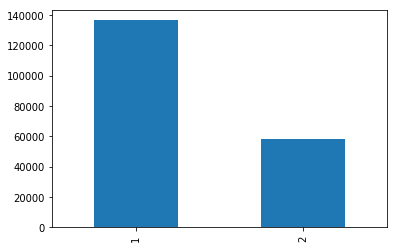

In [178]:
severity.plot(kind='bar')

In [215]:
cordinate=df.groupby(['X','Y']).size().rename('count').reset_index()
cordinate=pd.DataFrame(cordinate.head(10))
#cordinate
cordinate=cordinate.sort_values('count', ascending=False).reset_index(drop=True)
cordinate

,X,Y,count
0,-122.419032,47.575956,14
1,-122.418615,47.574866,8
2,-122.417113,47.577302,8
3,-122.418121,47.575093,2
4,-122.419091,47.575133,1
5,-122.418973,47.576779,1
6,-122.418757,47.660709,1
7,-122.418139,47.574598,1
8,-122.417114,47.653283,1
9,-122.417055,47.575975,1


In [ ]:
import requests

In [216]:
def location(a,b):
    URL="https://revgeocode.search.hereapi.com/v1/revgeocode"

    api_key = 'fzJEjWDf5m94iUCuZ_kQ90IhjPuVPMz4AZtH5Ea2l8k'

    PARAMS={
        'at':'{},{}'.format(b,a),
        'apikey':api_key
        }
    r=requests.get(url=URL, params=PARAMS)

    data=r.json()
    #print(data)
    #street = data['items'][0]['title']
    county=data['items'][0]['address']['street']
    #postalcode=data['items'][0]['address']['postalCode']
    
    return county
#print(f'{address} {'county'} {'postalcode'})

In [217]:
cordinate['street']=cordinate.apply(lambda row:location(row['X'],row['Y']), axis=1)

In [226]:
cordinate[['street','count']]

,street,count
0,Alki Ave SW,14
1,Beach Dr SW,8
2,Alki Ave SW,8
3,Beach Dr SW,2
4,Alki Ave SW,1
5,Alki Ave SW,1
6,Discovery Park Blvd,1
7,Beach Dr SW,1
8,W Roberts Way,1
9,SW Admiral Way,1


In [105]:
import folium
#itertools.repeat(float(price)

In [106]:
#conda install -c conda-forge shapely
from folium import plugins
import itertools
#Using Seattle's latitude and longitude 
latitude = 47.608013 
longitude = -122.335167


seattle_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

incidents = plugins.MarkerCluster().add_to(seattle_map)

for lat, lng, label in zip(cordinate.Y, cordinate.X, itertools.repeat(cordinate.count)):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=folium.Popup(label),
    ).add_to(incidents)

seattle_map

In [7]:
Addtype=pd.DataFrame(df['ADDRTYPE'].value_counts())
Addtype

,ADDRTYPE
Block,126926
Intersection,65070
Alley,751


In [221]:
import matplotlib.pyplot as plt
%matplotlib inline


#### Number of accident that occured over the year period.

In [222]:
df['year']=pd.to_datetime(df['INCDATE'], unit='ms').dt.year

In [223]:
accident_year=df['year'].value_counts()
accident_year=pd.DataFrame(accident_year)
accident_year.sort_index(inplace=True)
accident_year.columns=['Accident']

accident_year.head()

,Accident
2004,11865
2005,15115
2006,15188
2007,14456
2008,13660


Text(0.5, 1.0, 'Number of accident yearly')

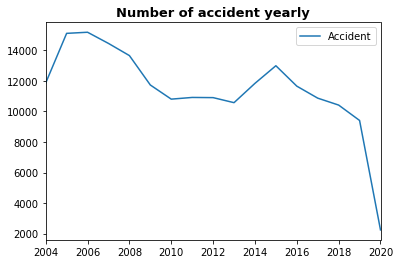

In [224]:
accident_year.plot.line()
plt.title('Number of accident yearly',weight='bold',fontsize=13)


In [13]:
import matplotlib.pyplot as plt 
from datetime import datetime as dt
%matplotlib inline

#### Drop column with 75% null values

In [14]:
df.isnull().sum()

SEVERITYCODE           0
X                   5334
Y                   5334
OBJECTID               0
INCKEY                 0
COLDETKEY              0
REPORTNO               0
STATUS                 0
ADDRTYPE            1926
INTKEY            129603
LOCATION            2677
EXCEPTRSNCODE     109862
EXCEPTRSNDESC     189035
SEVERITYCODE.1         0
SEVERITYDESC           0
COLLISIONTYPE       4904
PERSONCOUNT            0
PEDCOUNT               0
PEDCYLCOUNT            0
VEHCOUNT               0
INCDATE                0
INCDTTM                0
JUNCTIONTYPE        6329
SDOT_COLCODE           0
SDOT_COLDESC           0
INATTENTIONIND    164868
UNDERINFL           4884
WEATHER             5081
ROADCOND            5012
LIGHTCOND           5170
PEDROWNOTGRNT     190006
SDOTCOLNUM         79737
SPEEDING          185340
ST_COLCODE            18
ST_COLDESC          4904
SEGLANEKEY             0
CROSSWALKKEY           0
HITPARKEDCAR           0
year                   0
dtype: int64

In [4]:
df['JUNCTIONTYPE'].value_counts()

Mid-Block (not related to intersection)              89800
At Intersection (intersection related)               62810
Mid-Block (but intersection related)                 22790
Driveway Junction                                    10671
At Intersection (but not related to intersection)     2098
Ramp Junction                                          166
Unknown                                                  9
Name: JUNCTIONTYPE, dtype: int64

In [5]:
df['UNDERINFL'].value_counts() 

N    100274
0     80394
Y      5126
1      3995
Name: UNDERINFL, dtype: int64

In [7]:
df['UNDERINFL'].replace(to_replace=['Y','N'], value=[0,1],inplace=True)

In [8]:
null_col=["HITPARKEDCAR","ST_COLCODE","SDOT_COLCODE","PEDCOUNT","STATUS","INCKEY","COLDETKEY","X","Y","INCDATE","INCDTTM","COLLISIONTYPE", "PERSONCOUNT", "PEDCYLCOUNT", "VEHCOUNT","SEVERITYCODE.1","SEVERITYDESC","SEGLANEKEY","ST_COLDESC","SDOT_COLDESC","LOCATION","REPORTNO","OBJECTID","INTKEY","EXCEPTRSNDESC","EXCEPTRSNCODE","INATTENTIONIND","SPEEDING","PEDROWNOTGRNT", "SDOTCOLNUM"]

In [9]:
df2=df.drop(null_col, axis=1)
df2.head()

,SEVERITYCODE,ADDRTYPE,JUNCTIONTYPE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,CROSSWALKKEY
0,2,Intersection,At Intersection (intersection related),1,Overcast,Wet,Daylight,0
1,1,Block,Mid-Block (not related to intersection),0,Raining,Wet,Dark - Street Lights On,0
2,1,Block,Mid-Block (not related to intersection),0,Overcast,Dry,Daylight,0
3,1,Block,Mid-Block (not related to intersection),1,Clear,Dry,Daylight,0
4,2,Intersection,At Intersection (intersection related),0,Raining,Wet,Daylight,0


In [10]:
df2.isnull().sum()

SEVERITYCODE       0
ADDRTYPE        1926
JUNCTIONTYPE    6329
UNDERINFL       4884
WEATHER         5081
ROADCOND        5012
LIGHTCOND       5170
CROSSWALKKEY       0
dtype: int64

In [11]:
df2.dropna(inplace=True)
df2.isnull().sum()

SEVERITYCODE    0
ADDRTYPE        0
JUNCTIONTYPE    0
UNDERINFL       0
WEATHER         0
ROADCOND        0
LIGHTCOND       0
CROSSWALKKEY    0
dtype: int64

In [77]:
Feature=df2[['ADDRTYPE','LIGHTCOND','WEATHER','ROADCOND','UNDERINFL','JUNCTIONTYPE','CROSSWALKKEY']]


In [81]:
X=np.asarray(Feature)
X[0:5]

array([['Intersection', 'Daylight', 'Overcast', 'Wet', 1,
        'At Intersection (intersection related)', 0],
       ['Block', 'Dark - Street Lights On', 'Raining', 'Wet', '0',
        'Mid-Block (not related to intersection)', 0],
       ['Block', 'Daylight', 'Overcast', 'Dry', '0',
        'Mid-Block (not related to intersection)', 0],
       ['Block', 'Daylight', 'Clear', 'Dry', 1,
        'Mid-Block (not related to intersection)', 0],
       ['Intersection', 'Daylight', 'Raining', 'Wet', '0',
        'At Intersection (intersection related)', 0]], dtype=object)

In [82]:
from sklearn import preprocessing

In [83]:
addrtype = preprocessing.LabelEncoder()
addrtype.fit(['Block','Intersection','Alley'])
X[:,0] = addrtype.transform(X[:,0])

In [84]:
roadcond = preprocessing.LabelEncoder()
roadcond.fit([ 'Dry','Wet','Unknown','Ice','Snow/Slush','Other','Standing Water','Sand/Mud/Dirt','Oil'])
X[:,3] = roadcond.transform(X[:,3])

In [85]:
weather = preprocessing.LabelEncoder()
weather.fit(['Clear','Raining','Overcast','Snowing','Other','Fog/Smog/Smoke','Sleet/Hail/Freezing Rain','Unknown','Blowing Sand/Dirt','Severe Crosswind','Partly Cloudy'])
X[:,2] = weather.transform(X[:,2])

In [86]:
lightcond = preprocessing.LabelEncoder()
lightcond.fit(['Daylight','Dark - Street Lights On','Unknown','Dusk','Dawn','Dark - No Street Lights','Dark - Street Lights Off','Other','Dark - Unknown Lighting'])
X[:,1] = lightcond.transform(X[:,1])

In [87]:
junction = preprocessing.LabelEncoder()
junction.fit(['Mid-Block (not related to intersection)','At Intersection (intersection related)','Mid-Block (but intersection related)','Driveway Junction','At Intersection (but not related to intersection)','Ramp Junction','Unknown'])
X[:,5] = junction.transform(X[:,5])

In [88]:
X[0:5]

array([[2, 5, 4, 8, 1, 1, 0],
       [1, 2, 6, 8, '0', 4, 0],
       [1, 5, 4, 0, '0', 4, 0],
       [1, 5, 1, 0, 1, 4, 0],
       [2, 5, 6, 8, '0', 1, 0]], dtype=object)

In [ ]:
y=np.asarray(df2['SEVERITYCODE'])
y[0:5]

array([[2, 5, 4, 8, 1, 1, 0],
       [1, 2, 6, 8, '0', 4, 0],
       [1, 5, 4, 0, '0', 4, 0],
       [1, 5, 1, 0, 1, 4, 0],
       [2, 5, 6, 8, '0', 1, 0]], dtype=object)

In [69]:
y=np.asarray(df2['SEVERITYCODE'])
y[0:5]

array([2, 1, 1, 1, 2], dtype=int64)

### Normalize Data

In [70]:
X=preprocessing.StandardScaler().fit(X).transform(X)
X[0:2]

### Data splitting

In [71]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (146331, 7) (146331,)
Test set: (36583, 7) (36583,)


## Logistic Regression 

In [72]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

### Predict

In [73]:
yhat = LR.predict(X_test)
yhat[0:5]

array([1, 1, 1, 1, 2], dtype=int64)

In [74]:
yhat_prob = LR.predict_proba(X_test)
yhat_prob[0:5]

array([[0.72850749, 0.27149251],
       [0.70587228, 0.29412772],
       [0.70414617, 0.29585383],
       [0.72850749, 0.27149251],
       [0.16520557, 0.83479443]])

In [75]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y_test, yhat)

0.698521171035727

### SVM

In [56]:
from sklearn.tree import DecisionTreeClassifier
drugTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
drugTree

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [57]:
drugTree.fit(X_train,y_train)
predTree = drugTree.predict(X_test)

print (predTree [0:5])
print (y_test [0:5])

[1 1 1 1 1]
[1 1 2 1 2]


In [58]:
from sklearn import metrics
import matplotlib.pyplot as plt
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_test, predTree))

DecisionTrees's Accuracy:  0.6986578465407429
